In [1]:
import pandas as pd

import geopandas as gpd

import contextily as ctx

import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

import matplotlib.pyplot as plt

import plotly.express as px

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [5]:
Median_Income = gpd.read_file('Data/acs2019_5yr_B19013_14000US06037103400.geojson')

In [6]:
Median_Income.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1005 entries, 0 to 1004
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geoid             1005 non-null   object  
 1   name              1005 non-null   object  
 2   B19013001         993 non-null    float64 
 3   B19013001, Error  990 non-null    float64 
 4   geometry          1005 non-null   geometry
dtypes: float64(2), geometry(1), object(2)
memory usage: 39.4+ KB


In [7]:
Median_Income.head()

,geoid,name,B19013001,"B19013001, Error",geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",63534.0,16806.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",90389.0,9796.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",44083.0,9483.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",43713.0,4639.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",81776.0,11857.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


In [8]:
columns_to_keep = ['geoid',
                   'name',
                   'B19013001',
                   'geometry']

In [9]:
Median_Income = Median_Income[columns_to_keep]

In [10]:
Median_Income.head(5)

,geoid,name,B19013001,geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",63534.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",90389.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",44083.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",43713.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",81776.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


In [11]:
Median_Income.columns = ['geoid',
                         'name',
                         'median income',
                         'geometry']

In [12]:
Median_Income.head()

,geoid,name,median income,geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",63534.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",90389.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",44083.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",43713.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",81776.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


In [17]:
Median_Income_Sorted = Median_Income.sort_values(by='median income',ascending = False)

In [18]:
Median_Income_Sorted.head()

,geoid,name,median income,geometry
831,14000US06037262303,"Census Tract 2623.03, Los Angeles, CA",250001.0,"MULTIPOLYGON (((-118.49599 34.07105, -118.4959..."
832,14000US06037262400,"Census Tract 2624, Los Angeles, CA",250001.0,"MULTIPOLYGON (((-118.52146 34.11764, -118.5214..."
340,14000US06037141700,"Census Tract 1417, Los Angeles, CA",250001.0,"MULTIPOLYGON (((-118.45322 34.13557, -118.4531..."
994,14000US06037980019,"Census Tract 9800.19, Los Angeles, CA",231250.0,"MULTIPOLYGON (((-118.59919 34.07436, -118.5991..."
833,14000US06037262501,"Census Tract 2625.01, Los Angeles, CA",224962.0,"MULTIPOLYGON (((-118.52914 34.04991, -118.5290..."


<AxesSubplot:ylabel='Frequency'>

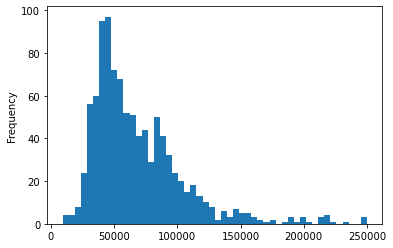

In [19]:
Median_Income['median income'].plot.hist(bins=50)

In [22]:
Neighborhood_Boundaries = gpd.read_file('Data/LA_Times_Neighborhood_Boundaries.zip')

In [23]:
Neighborhood_Boundaries = Neighborhood_Boundaries.to_crs(epsg=3857)

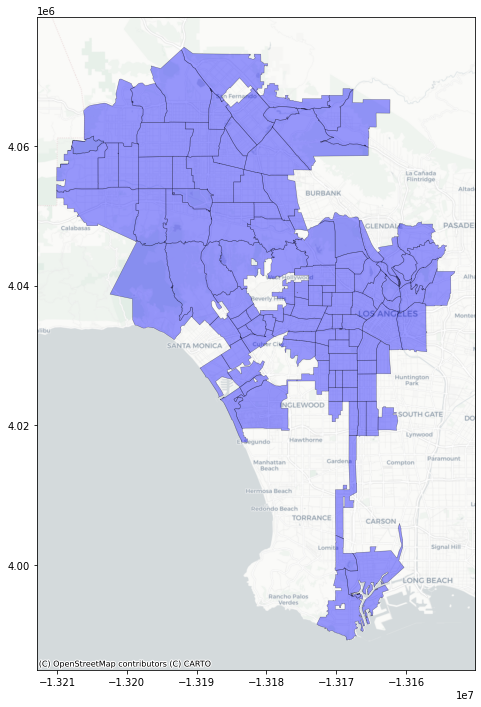

In [24]:
fig, ax = plt.subplots(figsize=(12,12))

Neighborhood_Boundaries.plot(ax=ax,
         color='blue', 
         edgecolor='black',
         lw=0.5,
         alpha=0.4)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

<AxesSubplot:>

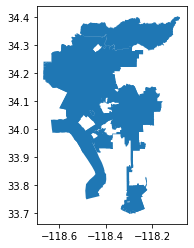

In [25]:
Median_Income_Sorted.plot()

In [26]:
token = 'pk.eyJ1IjoieW9obWFuIiwiYSI6IkxuRThfNFkifQ.u2xRJMiChx914U7mOZMiZw'
px.set_mapbox_access_token(token)

In [30]:
Median_Income= Median_Income.to_crs('epsg:4326')

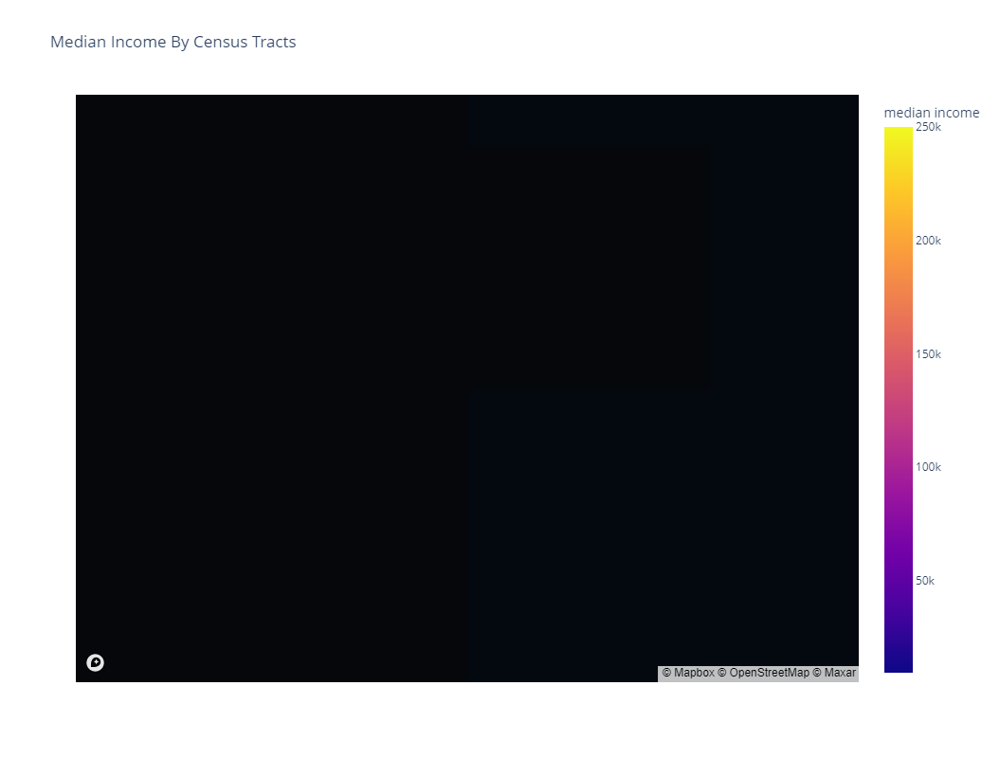

In [40]:
px.choropleth_mapbox(Median_Income, 
                     geojson=Median_Income.geometry, 
                     locations=Median_Income.index, 
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     hover_data=['name','median income'],
                     opacity=0.4,
                     height=800,
                     color='median income',
                     title= 'Median Income By Census Tracts')

In [41]:
px.choropleth_mapbox(Median_Income, 
                     geojson=Median_Income.geometry, 
                     locations=Median_Income.index, 
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     hover_data=['name','median income'],
                     opacity=0.4,
                     height=800,
                     color='median income',
                     title= 'Median Income By Census Tracts').write_html("Median Income By Census Tracts.html")